<a href="https://colab.research.google.com/github/semerriam/points-unknown-data/blob/main/Merriam_Census_Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## A story of Change
*Individual Assignment* - Due Monday, July 12 at 11:59AM

Work with the Census API to pull Census data and tell an interesting story of change. Individually, we want you to tell us a story about a community that experienced change over the past decade. Our hope is that you will select a table(s) and variable(s) specific to your topic area.

For this assignment, we are open to a variety of deliverables. The core deliverable, though, is a short narrative describing change over time in a location that is new to you. This narrative should be supported and informed by data analysis, and we would love it if you incorporate displays of the data. But displays are icing on the cake. Tell us a story that we don’t know, and specifically, a story that isn’t the typical population, race, or income narrative.

Notes:
> Your notebook should be linked to from this page. The notebook should be complete, from start to finish. It should load the appropriate libraries, and data, and produce all the data / insights behind the story. Incorporate your narrative in the notebook in markdown








## The Mystery of West Virginia's College Drop Rate


On June 12, Matt Turner, the Executive Vice Chancellor for Administration of the [West Virginia Higher Education Policy Commission (WVHEPC)](https://www.wvhepc.edu/), gave a readiness report to West Virginia's state legislature regarding the drop in the college-going rate to 46 percent for public high school graduates. “Our college going rate is just below 50 for the first time and that is a primary concern of Chancellor Tucker,” said Turner. 

While he listed potential reasons for the drop as covid-related disruptions such as the cancellation of ACT and SAT tests and zoom fatigue, the [commission’s statewide data](https://www.wvhepc.edu/resources/data-and-publication-center/cgr/) shows an overall decline of nearly 10 percent in the college-going rate since 2010, only 4 percent of which has occurred after 2019. Additionally, the college-going rate is now at the lowest point since the commission started tracking the data in 2001. 

Anecdotally, Turner says that the opioid epidemic may additionally be contributing to the decline in student enrollment. “I don't have the data to support it, but this is something that we think we are beginning to see— we're seeing kids from broken homes, those who are raised by grandparents and others, who as first generation rural students have enough of a challenge as it is, combine that with some of the opioid addiction problems that lots of rural states have faced.”

Unfortunately, the data doesn't seem to strongly support these claims. The counties with the most opioid related deaths do not appear to be strongly correlated with the counties with the largest declines in college-going rates, when analyzing 2018 data of fatal overdoses from the [West Virginia Office of Drug Policy.](https://dhhr.wv.gov/office-of-drug-control-policy/datadashboard/Pages/default.aspx)


Cost is one of the the top reasons that graduating high school students cited for not going to college according to a [2017 survey](https://public.tableau.com/app/profile/chris.treadway/viz/HSOS_2017/Introduction) conducted by the commission. However, counties where the median household income declined between 2010 and 2018 did not also see a strong correlation with the counties with declining college-going rates. Unsurprisingly, counties with higher median household incomes also have a higher percentage of residents with a bachelors degree compared to other counties though that is to be expected.  



Data Sources:
> WVHEPC Reports dataset was compiled from [reports](https://www.wvhepc.edu/resources/reports-and-publications/) between 2001 — 2018 and parsed into an excel sheet that can be found [here](https://docs.google.com/spreadsheets/d/1FnmhWrNdMvooGHI5BmulQ-Z3r4tfSzLoyP5VjHW3tK4/edit?usp=sharing)

> West Virginia Opioids data was from the [West Virginia Office of Drug Policy](https://dhhr.wv.gov/office-of-drug-control-policy/datadashboard/Pages/default.aspx)

> Data regarding Median Household Income and educational attainment by county is from the U.S. Census Bureau

### Importing Census Data for West Virginia

In [148]:
!pip install geopandas
!pip install cenpy
!pip install jenkspy
!pip install jsonschema==3.2
import numpy as np
import pandas as pd
import geopandas as gpd
import altair as alt
import cenpy as cen
import cenpy.tiger as tiger
import jenkspy
from getpass import getpass

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Let's reset our pandas display
pd.reset_option('display.max_colwidth')

In [3]:
CENSUS_API_KEY = getpass('Enter your Census API Key: ')

Enter your Census API Key: ··········


In [4]:
availableTables = cen.explorer.available()
print(f"The API offers access to {len(availableTables)} datasets")

The API offers access to 1247 datasets


In [5]:
availableTables.head(2)

,c_isTimeseries,temporal,spatial,c_isAggregate,publisher,references,programCode,modified,license,keyword,...,description,bureauCode,accessLevel,title,c_isAvailable,c_isCube,c_isMicrodata,c_documentationLink,c_dataset,vintage
ABSCB2017,NaN,NaN,NaN,True,U.S. Census Bureau,https://www.census.gov/developers/,006:007,2020-04-30 00:00:00.0,https://creativecommons.org/publicdomain/zero/...,"(census,)",...,The Annual Business Survey (ABS) provides info...,006:07,public,Economic Surveys: Annual Business Survey: Annu...,True,NaN,NaN,https://www.census.gov/developer/,"(abscb,)",2017.0
ABSCB2018,NaN,NaN,NaN,True,U.S. Census Bureau,https://www.census.gov/developers/,006:007,2020-10-26 00:00:00.0,https://creativecommons.org/publicdomain/zero/...,"(census,)",...,The Annual Business Survey (ABS) provides info...,006:07,public,Economic Surveys: Annual Business Survey: Annu...,True,NaN,NaN,https://www.census.gov/developer/,"(abscb,)",2018.0


In [6]:
availableTables.loc[availableTables['vintage'] == 2020.0].head(2)

,c_isTimeseries,temporal,spatial,c_isAggregate,publisher,references,programCode,modified,license,keyword,...,description,bureauCode,accessLevel,title,c_isAvailable,c_isCube,c_isMicrodata,c_documentationLink,c_dataset,vintage
ACSCP5Y2020,NaN,2020/2020,US,True,U.S. Census Bureau,https://www.census.gov/developers/,006:004,2021-07-13 00:00:00.0,https://creativecommons.org/publicdomain/zero/...,"(census,)",...,The American Community Survey (ACS) is an ongo...,006:07,public,American Community Survey: 5-Year Estimates: C...,True,True,NaN,https://www.census.gov/developer/,"(acs, acs5, cprofile)",2020.0
ACSDP5Y2020,NaN,2020/2020,US,True,U.S. Census Bureau,https://www.census.gov/developers/,006:004,2021-07-13 00:00:00.0,https://creativecommons.org/publicdomain/zero/...,"(census,)",...,The American Community Survey (ACS) is an ongo...,006:07,public,American Community Survey: 5-Year Estimates: D...,True,True,NaN,https://www.census.gov/developer/,"(acs, acs5, profile)",2020.0


Cenpy — ACS data

In [7]:
acs = cen.products.ACS()

In [8]:
acs.tables

,description,columns
table_name,,
B00001,UNWEIGHTED SAMPLE COUNT OF THE POPULATION,[B00001_001E]
B00002,UNWEIGHTED SAMPLE HOUSING UNITS,[B00002_001E]
B01001,SEX BY AGE,"[B01001_001E, B01001_002E, B01001_003E, B01001..."
B01002,MEDIAN AGE BY SEX,"[B01002_001E, B01002_002E, B01002_003E]"
B01003,TOTAL POPULATION,[B01003_001E]
...,...,...
C27014,PUBLIC HEALTH INSURANCE BY WORK EXPERIENCE,"[C27014_001E, C27014_002E, C27014_003E, C27014..."
C27016,HEALTH INSURANCE COVERAGE STATUS BY RATIO OF I...,"[C27016_001E, C27016_002E, C27016_003E, C27016..."
C27017,PRIVATE HEALTH INSURANCE BY RATIO OF INCOME TO...,"[C27017_001E, C27017_002E, C27017_003E, C27017..."


In [9]:
acs.filter_tables('RACE', by='description')

,description,columns
table_name,,
B02001,RACE,"[B02001_001E, B02001_002E, B02001_003E, B02001..."
B02008,WHITE ALONE OR IN COMBINATION WITH ONE OR MORE...,[B02008_001E]
B02009,BLACK OR AFRICAN AMERICAN ALONE OR IN COMBINAT...,[B02009_001E]
B02010,AMERICAN INDIAN AND ALASKA NATIVE ALONE OR IN ...,[B02010_001E]
B02011,ASIAN ALONE OR IN COMBINATION WITH ONE OR MORE...,[B02011_001E]
B02012,NATIVE HAWAIIAN AND OTHER PACIFIC ISLANDER ALO...,[B02012_001E]
B02013,SOME OTHER RACE ALONE OR IN COMBINATION WITH O...,[B02013_001E]
B03002,HISPANIC OR LATINO ORIGIN BY RACE,"[B03002_001E, B03002_002E, B03002_003E, B03002..."
B25006,RACE OF HOUSEHOLDER,"[B25006_001E, B25006_002E, B25006_003E, B25006..."


In [10]:
acs.filter_tables('HISPANIC', by='description')

,description,columns
table_name,,
B03001,HISPANIC OR LATINO ORIGIN BY SPECIFIC ORIGIN,"[B03001_001E, B03001_002E, B03001_003E, B03001..."
B03002,HISPANIC OR LATINO ORIGIN BY RACE,"[B03002_001E, B03002_002E, B03002_003E, B03002..."
B03003,HISPANIC OR LATINO ORIGIN,"[B03003_001E, B03003_002E, B03003_003E]"
B16006,LANGUAGE SPOKEN AT HOME BY ABILITY TO SPEAK EN...,"[B16006_001E, B16006_002E, B16006_003E, B16006..."
B98013,TOTAL POPULATION COVERAGE RATE BY WEIGHTING RA...,"[B98013_001E, B98013_002E, B98013_003E, B98013..."
B99031,ALLOCATION OF HISPANIC OR LATINO ORIGIN,"[B99031_001E, B99031_002E, B99031_003E]"


In [11]:
acs.filter_tables('B030', by='table_name')

,description,columns
table_name,,
B03001,HISPANIC OR LATINO ORIGIN BY SPECIFIC ORIGIN,"[B03001_001E, B03001_002E, B03001_003E, B03001..."
B03002,HISPANIC OR LATINO ORIGIN BY RACE,"[B03002_001E, B03002_002E, B03002_003E, B03002..."
B03003,HISPANIC OR LATINO ORIGIN,"[B03003_001E, B03003_002E, B03003_003E]"


##### Median HH Income

In [12]:
acs.filter_variables('B19013')

,label,concept,predicateType,group,limit,predicateOnly,hasGeoCollectionSupport,attributes,required,values
B19013E_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013E,0,NaN,NaN,"B19013E_001EA,B19013E_001M,B19013E_001MA",NaN,NaN
B19013D_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013D,0,NaN,NaN,"B19013D_001EA,B19013D_001M,B19013D_001MA",NaN,NaN
B19013I_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013I,0,NaN,NaN,"B19013I_001EA,B19013I_001M,B19013I_001MA",NaN,NaN
B19013A_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013A,0,NaN,NaN,"B19013A_001EA,B19013A_001M,B19013A_001MA",NaN,NaN
B19013F_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013F,0,NaN,NaN,"B19013F_001EA,B19013F_001M,B19013F_001MA",NaN,NaN
B19013G_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013G,0,NaN,NaN,"B19013G_001EA,B19013G_001M,B19013G_001MA",NaN,NaN
B19013B_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013B,0,NaN,NaN,"B19013B_001EA,B19013B_001M,B19013B_001MA",NaN,NaN
B19013C_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013C,0,NaN,NaN,"B19013C_001EA,B19013C_001M,B19013C_001MA",NaN,NaN
B19013_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013,0,NaN,NaN,"B19013_001EA,B19013_001M,B19013_001MA",NaN,NaN
B19013H_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013H,0,NaN,NaN,"B19013H_001EA,B19013H_001M,B19013H_001MA",NaN,NaN


In [13]:
acs.filter_variables('B19013')

,label,concept,predicateType,group,limit,predicateOnly,hasGeoCollectionSupport,attributes,required,values
B19013E_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013E,0,NaN,NaN,"B19013E_001EA,B19013E_001M,B19013E_001MA",NaN,NaN
B19013D_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013D,0,NaN,NaN,"B19013D_001EA,B19013D_001M,B19013D_001MA",NaN,NaN
B19013I_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013I,0,NaN,NaN,"B19013I_001EA,B19013I_001M,B19013I_001MA",NaN,NaN
B19013A_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013A,0,NaN,NaN,"B19013A_001EA,B19013A_001M,B19013A_001MA",NaN,NaN
B19013F_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013F,0,NaN,NaN,"B19013F_001EA,B19013F_001M,B19013F_001MA",NaN,NaN
B19013G_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013G,0,NaN,NaN,"B19013G_001EA,B19013G_001M,B19013G_001MA",NaN,NaN
B19013B_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013B,0,NaN,NaN,"B19013B_001EA,B19013B_001M,B19013B_001MA",NaN,NaN
B19013C_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013C,0,NaN,NaN,"B19013C_001EA,B19013C_001M,B19013C_001MA",NaN,NaN
B19013_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013,0,NaN,NaN,"B19013_001EA,B19013_001M,B19013_001MA",NaN,NaN
B19013H_001E,Estimate!!Median household income in the past ...,MEDIAN HOUSEHOLD INCOME IN THE PAST 12 MONTHS ...,int,B19013H,0,NaN,NaN,"B19013H_001EA,B19013H_001M,B19013H_001MA",NaN,NaN


Educational Attainment

In [14]:
acs.filter_tables('EDUCATIONAL ATTAINMENT', by='description')

,description,columns
table_name,,
B06009,PLACE OF BIRTH BY EDUCATIONAL ATTAINMENT IN TH...,"[B06009_001E, B06009_002E, B06009_003E, B06009..."
B07009,GEOGRAPHICAL MOBILITY IN THE PAST YEAR BY EDUC...,"[B07009_001E, B07009_002E, B07009_003E, B07009..."
B07409,GEOGRAPHICAL MOBILITY IN THE PAST YEAR BY EDUC...,"[B07409_001E, B07409_002E, B07409_003E, B07409..."
B13014,WOMEN 15 TO 50 YEARS WHO HAD A BIRTH IN THE PA...,"[B13014_001E, B13014_002E, B13014_003E, B13014..."
B14005,SEX BY SCHOOL ENROLLMENT BY EDUCATIONAL ATTAIN...,"[B14005_001E, B14005_002E, B14005_003E, B14005..."
B15001,SEX BY AGE BY EDUCATIONAL ATTAINMENT FOR THE P...,"[B15001_001E, B15001_002E, B15001_003E, B15001..."
B15002,SEX BY EDUCATIONAL ATTAINMENT FOR THE POPULATI...,"[B15002_001E, B15002_002E, B15002_003E, B15002..."
B15003,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,"[B15003_001E, B15003_002E, B15003_003E, B15003..."
B16010,EDUCATIONAL ATTAINMENT AND EMPLOYMENT STATUS B...,"[B16010_001E, B16010_002E, B16010_003E, B16010..."


In [15]:
acs.filter_tables('B15002', by='table_name')

,description,columns
table_name,,
B15002,SEX BY EDUCATIONAL ATTAINMENT FOR THE POPULATI...,"[B15002_001E, B15002_002E, B15002_003E, B15002..."


In [16]:
acs.filter_tables('B15003', by='table_name')

,description,columns
table_name,,
B15003,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,"[B15003_001E, B15003_002E, B15003_003E, B15003..."


In [17]:
acs.filter_variables('B15003')

,label,concept,predicateType,group,limit,predicateOnly,hasGeoCollectionSupport,attributes,required,values
B15003_025E,Estimate!!Total!!Doctorate degree,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_025EA,B15003_025M,B15003_025MA",NaN,NaN
B15003_024E,Estimate!!Total!!Professional school degree,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_024EA,B15003_024M,B15003_024MA",NaN,NaN
B15003_023E,Estimate!!Total!!Master's degree,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_023EA,B15003_023M,B15003_023MA",NaN,NaN
B15003_022E,Estimate!!Total!!Bachelor's degree,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_022EA,B15003_022M,B15003_022MA",NaN,NaN
B15003_021E,Estimate!!Total!!Associate's degree,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_021EA,B15003_021M,B15003_021MA",NaN,NaN
B15003_020E,"Estimate!!Total!!Some college, 1 or more years...",EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_020EA,B15003_020M,B15003_020MA",NaN,NaN
B15003_003E,Estimate!!Total!!Nursery school,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_003EA,B15003_003M,B15003_003MA",NaN,NaN
B15003_002E,Estimate!!Total!!No schooling completed,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_002EA,B15003_002M,B15003_002MA",NaN,NaN
B15003_001E,Estimate!!Total,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_001EA,B15003_001M,B15003_001MA",NaN,NaN
B15003_009E,Estimate!!Total!!5th grade,EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 Y...,int,B15003,0,NaN,NaN,"B15003_009EA,B15003_009M,B15003_009MA",NaN,NaN


In [18]:
acs.filter_tables('B20004', by='table_name')

,description,columns
table_name,,
B20004,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,"[B20004_001E, B20004_002E, B20004_003E, B20004..."


In [19]:
acs.filter_variables('B20004')

,label,concept,predicateType,group,limit,predicateOnly,hasGeoCollectionSupport,attributes,required,values
B20004_003E,Estimate!!Total!!High school graduate (include...,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_003EA,B20004_003M,B20004_003MA",NaN,NaN
B20004_004E,Estimate!!Total!!Some college or associate's d...,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_004EA,B20004_004M,B20004_004MA",NaN,NaN
B20004_005E,Estimate!!Total!!Bachelor's degree,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_005EA,B20004_005M,B20004_005MA",NaN,NaN
B20004_006E,Estimate!!Total!!Graduate or professional degree,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_006EA,B20004_006M,B20004_006MA",NaN,NaN
B20004_001E,Estimate!!Total,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_001EA,B20004_001M,B20004_001MA",NaN,NaN
B20004_002E,Estimate!!Total!!Less than high school graduate,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_002EA,B20004_002M,B20004_002MA",NaN,NaN
B20004_007E,Estimate!!Total!!Male,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_007EA,B20004_007M,B20004_007MA",NaN,NaN
B20004_008E,Estimate!!Total!!Male!!Less than high school g...,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_008EA,B20004_008M,B20004_008MA",NaN,NaN
B20004_009E,Estimate!!Total!!Male!!High school graduate (i...,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_009EA,B20004_009M,B20004_009MA",NaN,NaN
B20004_015E,Estimate!!Total!!Female!!High school graduate ...,MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2017...,int,B20004,0,NaN,NaN,"B20004_015EA,B20004_015M,B20004_015MA",NaN,NaN


In [20]:
# Here, we are setting a variable (con) for making a call to this specific table.
con = cen.remote.APIConnection('ACSDT5Y2020',apikey=CENSUS_API_KEY)

# Next we will look at the variables available to us in this table.
variables = con.variables

# We then want to identify the columns we want to map. Here, I will include Median Household Income, and total population (which should be included by default)
columns = [
    'B01003_001', # Total Population
    'B19013_001', # Median Household Income
]

# Notice the E was absent from the columns identified. The E identifies the column as an estimate. But we also want to include margins of error with our estimate. Hence the code below.
columns_E = [i+'E' for i in columns]
columns_M = [i+'M' for i in columns]

# Define the units of geography, as well as a filter for what we are looking for. 
# State codes can be found at https://www.census.gov/library/reference/code-lists/ansi/ansi-codes-for-states.html
# You can also use the Missouri Census Data Center, which has great resources for lookups - https://mcdc.missouri.edu/
# Geographies: zip code tabulation area, school district (elementary), school district (secondary), combined statistical area, congressional district, county, tract, block group
# Filters on the geography: filter to tracts within state and county = {'state':'12', 'county':'073'}
g_unit = 'county'
g_filter = {'state':'54'}

# Make an API call for our tables/columns at the county level for the state of Minnesota and save to DF
wvIncome2020 = con.query(columns_E + columns_M, geo_unit=g_unit, geo_filter=g_filter)

In [21]:
wvIncome2020.head(5)

,B01003_001E,B19013_001E,B01003_001M,B19013_001M,state,county
0,16543,38906,-555555555,2627,54,001
1,21897,45297,-555555555,5910,54,005
2,14032,43819,-555555555,6364,54,007
3,93328,41472,-555555555,1910,54,011
4,7185,38668,-555555555,4908,54,013


In [22]:
# Here, we are setting a variable (con) for making a call to this specific table.
con = cen.remote.APIConnection('ACSDT5Y2010',apikey=CENSUS_API_KEY)

# Next we will look at the variables available to us in this table.
variables = con.variables

# We then want to identify the columns we want to map. Here, I will include Median Household Income, and total population (which should be included by default)
columns = [
    'B01003_001', # Total Population
    'B19013_001', # Median Household Income
]

# Notice the E was absent from the columns identified. The E identifies the column as an estimate. But we also want to include margins of error with our estimate. Hence the code below.
columns_E = [i+'E' for i in columns]
columns_M = [i+'M' for i in columns]

# Define the units of geography, as well as a filter for what we are looking for. 
# State codes can be found at https://www.census.gov/library/reference/code-lists/ansi/ansi-codes-for-states.html
# You can also use the Missouri Census Data Center, which has great resources for lookups - https://mcdc.missouri.edu/
# Geographies: zip code tabulation area, school district (elementary), school district (secondary), combined statistical area, congressional district, county, tract, block group
# Filters on the geography: filter to tracts within state and county = {'state':'12', 'county':'073'}
g_unit = 'county'
g_filter = {'state':'54'}

# Make an API call for our tables/columns at the county level for the state of Minnesota and save to DF
wvIncome2010 = con.query(columns_E + columns_M, geo_unit=g_unit, geo_filter=g_filter)

In [23]:
wvIncome2010.head(5)

,B01003_001E,B19013_001E,B01003_001M,B19013_001M,state,county
0,16256,31212,-555555555,2566,54,001
1,100910,52857,-555555555,2182,54,003
2,24872,39783,-555555555,2561,54,005
3,14558,32158,-555555555,2745,54,007
4,24194,39475,-555555555,2027,54,009


In [24]:
# Here, we are setting a variable (con) for making a call to this specific table.
con = cen.remote.APIConnection('ACSDT5Y2018',apikey=CENSUS_API_KEY)

# Next we will look at the variables available to us in this table.
variables = con.variables

# We then want to identify the columns we want to map. Here, I will include Median Household Income, and total population (which should be included by default)
columns = [
    'B01003_001', # Total Population
    'B19013_001', # Median Household Income
]

# Notice the E was absent from the columns identified. The E identifies the column as an estimate. But we also want to include margins of error with our estimate. Hence the code below.
columns_E = [i+'E' for i in columns]
columns_M = [i+'M' for i in columns]

# Define the units of geography, as well as a filter for what we are looking for. 
# State codes can be found at https://www.census.gov/library/reference/code-lists/ansi/ansi-codes-for-states.html
# You can also use the Missouri Census Data Center, which has great resources for lookups - https://mcdc.missouri.edu/
# Geographies: zip code tabulation area, school district (elementary), school district (secondary), combined statistical area, congressional district, county, tract, block group
# Filters on the geography: filter to tracts within state and county = {'state':'12', 'county':'073'}
g_unit = 'county'
g_filter = {'state':'54'}

# Make an API call for our tables/columns at the county level for the state of Minnesota and save to DF
wvIncome2018 = con.query(columns_E + columns_M, geo_unit=g_unit, geo_filter=g_filter)

In [25]:
wvIncome2018.head(5)

,B01003_001E,B19013_001E,B01003_001M,B19013_001M,state,county
0,5797,40189,-555555555,3985,54,105
1,8785,35875,-555555555,4142,54,015
2,105252,49926,-555555555,1659,54,061
3,15614,42125,-555555555,2794,54,103
4,185710,45426,-555555555,1901,54,039


In [26]:
# Here, we are setting a variable (con) for making a call to this specific table.
con = cen.remote.APIConnection('ACSDT5Y2018',apikey=CENSUS_API_KEY)

# Next we will look at the variables available to us in this table.
variables = con.variables

# We then want to identify the columns we want to map. Here, I will include Median Household Income, and total population (which should be included by default)
columns = [
    'B15003_001', # Total Population
    'B15003_022', # Median Household Income
]

# Notice the E was absent from the columns identified. The E identifies the column as an estimate. But we also want to include margins of error with our estimate. Hence the code below.
columns_E = [i+'E' for i in columns]
columns_M = [i+'M' for i in columns]

# Define the units of geography, as well as a filter for what we are looking for. 
# State codes can be found at https://www.census.gov/library/reference/code-lists/ansi/ansi-codes-for-states.html
# You can also use the Missouri Census Data Center, which has great resources for lookups - https://mcdc.missouri.edu/
# Geographies: zip code tabulation area, school district (elementary), school district (secondary), combined statistical area, congressional district, county, tract, block group
# Filters on the geography: filter to tracts within state and county = {'state':'12', 'county':'073'}
g_unit = 'county'
g_filter = {'state':'54'}

# Make an API call for our tables/columns at the county level for the state of Minnesota and save to DF
wvedu2018 = con.query(columns_E + columns_M, geo_unit=g_unit, geo_filter=g_filter)

In [27]:
wvedu2018.head(5)

,B15003_001E,B15003_022E,B15003_001M,B15003_022M,state,county
0,4137,227,51,86,54,105
1,6176,384,-555555555,112,54,015
2,64910,13782,219,909,54,061
3,11246,925,52,173,54,103
4,134008,19321,130,997,54,039


Downloading 2020 County Census Data from TIGER FTP

In [28]:
usGeo2020 = gpd.read_file('https://www2.census.gov/geo/tiger/GENZ2020/shp/cb_2020_us_county_5m.zip')

In [29]:
usGeo2020 = usGeo2020.to_crs('epsg:4326')

In [30]:
alt.Chart(usGeo2020).mark_geoshape()

alt.Chart(...)

In [31]:
usGeo2018 = gpd.read_file('https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_county_5m.zip')

In [32]:
usGeo2018 = usGeo2018.to_crs('epsg:4326')

In [33]:
alt.Chart(usGeo2018).mark_geoshape()

alt.Chart(...)

In [34]:
usGeo2018.shape

(3233, 10)

In [35]:
usGeo2018.head(4)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,39,071,01074048,0500000US39071,39071,Highland,06,1432479992,12194983,"POLYGON ((-83.86976 39.05553, -83.86568 39.247..."
1,06,003,01675840,0500000US06003,06003,Alpine,06,1912292630,12557304,"POLYGON ((-120.07248 38.50987, -120.07239 38.7..."
2,12,033,00295737,0500000US12033,12033,Escambia,06,1701544502,563927612,"POLYGON ((-87.62999 30.87766, -87.62946 30.880..."
3,17,101,00424252,0500000US17101,17101,Lawrence,06,963936864,5077783,"POLYGON ((-87.91028 38.57493, -87.90811 38.850..."


In [36]:
# tiger.available()

In [37]:
wvGeo = usGeo2018.loc[usGeo2018['STATEFP'] == '54'].reset_index(drop=True)

In [38]:
wvGeo.shape

(55, 10)

In [39]:
wvGeo.head(5)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393..."
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482..."
2,54,067,01550040,0500000US54067,54067,Nicholas,06,1675324341,19580622,"POLYGON ((-81.23143 38.26372, -81.09879 38.326..."
3,54,101,01550057,0500000US54101,54101,Webster,06,1433481442,7144590,"POLYGON ((-80.65079 38.52659, -80.50865 38.645..."
4,54,075,01550044,0500000US54075,54075,Pocahontas,06,2435361700,3939156,"POLYGON ((-80.36005 38.22584, -80.35217 38.345..."


### Merging Census Data — Median Income

In [40]:
wvGeo.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393..."
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482..."


In [41]:
wvIncome2018.head(1)

,B01003_001E,B19013_001E,B01003_001M,B19013_001M,state,county
0,5797,40189,-555555555,3985,54,105


In [42]:
wvIncome2018['GEOID'] = wvIncome2018['state'] + wvIncome2018['county']

In [43]:
wvGeo.shape

(55, 10)

In [44]:
wvIncome2018.shape

(55, 7)

In [45]:
# print(wvGeo.GEOID)
# print(wvIncome2018.GEOID)

In [46]:
wvIncome = wvGeo.merge(wvIncome2018, on='GEOID')

In [47]:
wvIncome.head(3)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,B01003_001E,B19013_001E,B01003_001M,B19013_001M,state,county
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,-555555555,2734,54,091
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,-555555555,1915,54,047
2,54,067,01550040,0500000US54067,54067,Nicholas,06,1675324341,19580622,"POLYGON ((-81.23143 38.26372, -81.09879 38.326...",25324,38468,-555555555,2229,54,067


In [48]:
wvIncome['B01003_001E'] = wvIncome['B01003_001E'].astype(int)

In [49]:
wvIncome['B19013_001E'] = wvIncome['B19013_001E'].astype(int)

In [50]:
wvIncomeMap = alt.Chart(wvIncome).mark_geoshape().encode(
    color=alt.Color('B19013_001E:Q', legend=alt.Legend(title='Median Household Income (Dollars)', format='$,.2r')),
    tooltip=[alt.Tooltip('NAME',title='County'),
      alt.Tooltip('B01003_001E',title='Population', format=','),
      alt.Tooltip('B19013_001E',title='Median Household Income', format='$,.2r')]
).properties(
    width=250,
    height=250,
    title='Median Household Income 2018 (WV)'
).project(
    type='conicConformal', 
    parallels=[45 + 37 / 60, 47 + 3 / 60], 
    rotate=[94 + 15 / 60, 0]
)

wvIncomeMap

alt.Chart(...)

In [51]:
wvIncome2010.head(2)

,B01003_001E,B19013_001E,B01003_001M,B19013_001M,state,county
0,16256,31212,-555555555,2566,54,001
1,100910,52857,-555555555,2182,54,003


In [52]:
wvIncome2010['GEOID'] = wvIncome2010['state'] + wvIncome2010['county']

In [53]:
wvIncome2010.shape

(55, 7)

In [54]:
wvIncome2010_merged = wvGeo.merge(wvIncome2010, on='GEOID')

In [55]:
wvIncome2010_merged['B01003_001E'] = wvIncome2010_merged['B01003_001E'].astype(int)

In [56]:
wvIncome2010_merged['B19013_001E'] = wvIncome2010_merged['B19013_001E'].astype(int)

In [57]:
wvIncome2010_merged.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,B01003_001E,B19013_001E,B01003_001M,B19013_001M,state,county
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16732,36956,-555555555,3388,54,091
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",22555,22154,-555555555,1381,54,047


In [58]:
wvIncomeMap2010 = alt.Chart(wvIncome2010_merged).mark_geoshape().encode(
    color=alt.Color('B19013_001E:Q', legend=alt.Legend(title='Median Household Income (Dollars)', format='$,.2r')),
    tooltip=[alt.Tooltip('NAME',title='County'),
      alt.Tooltip('B01003_001E',title='Population', format=','),
      alt.Tooltip('B19013_001E',title='Median Household Income', format='$,.2r')]
).properties(
    width=250,
    height=250,
    title='Median Household Income 2010 (WV)'
).project(
    type='conicConformal', 
    parallels=[45 + 37 / 60, 47 + 3 / 60], 
    rotate=[94 + 15 / 60, 0]
)

wvIncomeMap2010

alt.Chart(...)

-----

### Merging Census Data — Educational Attainment Bachelor's Degree (for ages 25+)

In [59]:
wvGeo.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393..."
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482..."


In [60]:
wvedu2018.head(2)

,B15003_001E,B15003_022E,B15003_001M,B15003_022M,state,county
0,4137,227,51,86,54,105
1,6176,384,-555555555,112,54,015


In [61]:
wvedu2018['GEOID'] = wvedu2018['state'] + wvedu2018['county']

In [62]:
wvEdu = wvGeo.merge(wvedu2018, on='GEOID')

In [63]:
wvEdu.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,B15003_001E,B15003_022E,B15003_001M,B15003_022M,state,county
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",12342,1548,71,226,54,091
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",14014,427,47,111,54,047


In [64]:
wvEdu['B15003_022E'] = wvEdu['B15003_022E'].astype(int)

In [65]:
wvEdu['B15003_001E'] = wvEdu['B15003_001E'].astype(int)

In [66]:
wvEdu['edu_pct'] = ((wvEdu['B15003_022E'] / wvEdu['B15003_001E']))

In [67]:
wvEdu.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,B15003_001E,B15003_022E,B15003_001M,B15003_022M,state,county,edu_pct
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",12342,1548,71,226,54,091,0.125425
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",14014,427,47,111,54,047,0.030470


In [68]:
wvEduMap = alt.Chart(wvEdu).mark_geoshape().encode(
    color=alt.Color('B15003_001E:Q', legend=alt.Legend(title='Bachelors Degree Attainment', format=',.2r')),
    tooltip=[alt.Tooltip('NAME',title='County'),
      alt.Tooltip('B15003_001E',title='Total', format=','),
      alt.Tooltip('B15003_022E',title='Received Bachelors Degree', format=',.2r')]
).properties(
    width=250,
    height=250,
    title='Bachelors Degree Attainment (WV)'
).project(
    type='conicConformal', 
    parallels=[45 + 37 / 60, 47 + 3 / 60], 
    rotate=[94 + 15 / 60, 0]
)

wvEduMap

alt.Chart(...)

Bachelors Degree Normalized for Population Size

In [69]:
wvEduMap2 = alt.Chart(wvEdu).mark_geoshape().encode(
    color=alt.Color('edu_pct:Q', legend=alt.Legend(title='Bachelors Degree Attainment %', format=',.2r')),
    tooltip=[alt.Tooltip('NAME',title='County'),
             alt.Tooltip('edu_pct',title='Percentage of Population Received Bachelors Degree', format=','),
      alt.Tooltip('B15003_001E',title='Total', format=','),
      alt.Tooltip('B15003_022E',title='Received Bachelors Degree', format=',.2r')]
).properties(
    width=250,
    height=250,
    title='Bachelors Degree Attainment (WV)'
).project(
    type='conicConformal', 
    parallels=[45 + 37 / 60, 47 + 3 / 60], 
    rotate=[94 + 15 / 60, 0]
)

wvEduMap2

alt.Chart(...)

### Go-To-College Rates from WVHEPC Reports

Source: Parsed the 2001-2018 PDFs from https://www.wvhepc.edu/resources/reports-and-publications/

In [70]:
pct_only = pd.read_csv('pct_only.csv')
pct_only.sample(5)

,COUNTY,2018,2017,2016,2015,2014,2013,2012,2011,2010,2009,2008,2007,2006,2005,2004,2003,2002,2001
40,Raleigh*,50.7,50.4,52.1,51.8,47.7,44.8,46.6,47.0,41.8,51.8,51.5,45.8,42.1,48.8,49.9,54.97,49.80,46.45
18,Jefferson,60.1,61.6,62.8,60.2,60.4,64.0,62.1,65.5,61.4,53.5,71.8,59.7,54.5,53.8,51.5,56.73,48.09,41.90
2,Boone*,43.9,55.2,43.8,51.3,56.5,55.0,52.2,52.5,57.1,51.4,44.2,51.5,47.6,52.7,55.7,59.59,52.71,56.03
25,Mason,38.9,47.7,49.8,48.8,50.0,46.9,50.0,59.2,61.4,55.4,60.4,53.2,46.0,57.7,53.5,53.22,51.09,47.91
33,Nicholas,47.3,46.9,52.3,48.6,44.0,43.2,42.6,52.5,51.1,51.5,48.0,49.6,49.2,52.9,49.0,51.51,48.56,52.23


In [71]:
pct_w_pctchange = pd.read_csv('pct_w_pctchange.csv')
pct_w_pctchange.sample(5)

,Unnamed: 0,2018,Unnamed: 2,2017,Unnamed: 4,2016,Unnamed: 6,2015,Unnamed: 8,2014,...,Unnamed: 26,2005,Unnamed: 28,2004,Unnamed: 30,2003,Unnamed: 32,2002,Unnamed: 34,2001
52,Wetzel,50.5,1.0,49.5,-9.5,59.0,9.9,49.1,4.1,45.0,...,2.1,56.7,-4.5,61.2,4.0,57.20,-6.03,63.23,7.32,55.91
16,Hardy,42.1,-16.1,58.2,14.8,43.4,-15.0,58.4,-2.4,60.8,...,1.3,54.5,5.6,48.9,2.9,46.03,-0.25,46.28,-15.82,62.10
53,Wirt,45.7,2.2,43.5,-6.5,50.0,-3.2,53.2,3.2,50.0,...,-12.3,71.7,19.3,52.4,-3.6,56.04,6.04,50.00,-4.64,54.64
0,COUNTY,%,NaN,%,NaN,%,NaN,%,NaN,%,...,NaN,%,NaN,%,NaN,%,NaN,%,NaN,%
8,Clay,41.4,-3.3,44.7,-8.5,53.2,12.1,41.1,0.0,41.1,...,5.3,43.8,-1.3,45.1,-0.2,45.30,-0.67,45.97,1.00,44.97


In [72]:
num_students_enrolled = pd.read_csv('num_students_enrolled.csv')
num_students_enrolled.sample(5)

,COUNTY,2018,2017,2016,2015,2014,2013,2012,2011,2010,2009,2008,2007,2006,2005,2004,2003,2002,2001
49,Wayne,267,312,276,264,247,284,251,244,321,339,264,279,256,292,212,219,192,239
23,Marion,321,332,291,281,258,296,271,316,339,335,337,351,359,341,362,332,386,391
24,Marshall,167,167,188,173,195,181,230,234,255,289,275,246,241,256,242,229,251,265
0,Barbour,56,74,58,79,80,87,77,86,75,84,96,90,67,66,92,77,84,108
54,Wyoming,116,136,122,117,129,112,85,98,128,116,126,122,126,124,125,124,122,155


Key Column: 2018_wt_value_pct_change

In [73]:
calcs = pd.read_csv('CALCS_pct_w_pctchange_8yr_w_pop.csv')
calcs.sample(5)

,COUNTY,2018,pct_change_2018_2010,2010,pct_change_2010_2002,2002,2018_num,2018_rate_x_pop,2018_wt_value_rate,2018_pct_change_x_pop,2018_wt_value_pct_change,2010_num,2002_num
2,Berkeley,52.7,-7.9,60.6,11.6,49.04,674,"35,519.80",#REF!,"-5,324.60",-0.536,638,356
14,Boone,43.9,-13.2,57.1,4.4,52.71,123,"5,399.70",11.56,"-1,623.60",-0.164,164,136
51,Braxton,46.7,8.2,38.5,-5.4,43.92,63,"2,942.10",0.3,516.6,0.052,55,65
16,Harrison,57.9,-3.6,61.5,-20.6,82.08,443,"25,649.70",#REF!,"-1,594.80",-0.161,452,609
48,Ohio,72.7,0.9,71.8,-9.8,81.56,355,"25,808.50",38.29,319.5,0.032,364,407


In [74]:
wvGeo.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393..."
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482..."


In [75]:
wvGeo2 = wvGeo

In [76]:
wvGeo2 = wvGeo2.rename(columns={"NAME": "COUNTY",})

In [77]:
wvGeo2.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,COUNTY,LSAD,ALAND,AWATER,geometry
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393..."
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482..."


In [78]:
calcs.shape

(56, 13)

In [79]:
calcs.head(3)

,COUNTY,2018,pct_change_2018_2010,2010,pct_change_2010_2002,2002,2018_num,2018_rate_x_pop,2018_wt_value_rate,2018_pct_change_x_pop,2018_wt_value_pct_change,2010_num,2002_num
0,TOTAL,52.6,-6.2,58.8,2.3,56.53,"9,927",NaN,NaN,NaN,NaN,"10,753","10,081"
1,Kanawha,56.1,-6.9,63.0,-1.4,64.36,998,"55,987.80",#REF!,"-6,886.20",-0.694,"1,119","1,136"
2,Berkeley,52.7,-7.9,60.6,11.6,49.04,674,"35,519.80",#REF!,"-5,324.60",-0.536,638,356


In [80]:
calcs_merged = wvGeo2.merge(calcs, on='COUNTY')

In [81]:
calcs_merged.shape

(55, 22)

In [82]:
calcs_merged.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,COUNTY,LSAD,ALAND,AWATER,geometry,...,2010,pct_change_2010_2002,2002,2018_num,2018_rate_x_pop,2018_wt_value_rate,2018_pct_change_x_pop,2018_wt_value_pct_change,2010_num,2002_num
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",...,62.4,-13.1,75.52,68,"3,352.40",19.95,-890.8,-0.090,93,108
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",...,22.0,-14.0,35.95,68,"2,359.60",0.24,863.6,0.087,51,87


Key Column: 2018_wt_value_pct_change

In [83]:
calcs_merged.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,COUNTY,LSAD,ALAND,AWATER,geometry,...,2010,pct_change_2010_2002,2002,2018_num,2018_rate_x_pop,2018_wt_value_rate,2018_pct_change_x_pop,2018_wt_value_pct_change,2010_num,2002_num
0,54,091,01689856,0500000US54091,54091,Taylor,06,447475055,7532835,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",...,62.4,-13.1,75.52,68,"3,352.40",19.95,-890.8,-0.090,93,108
1,54,047,01689162,0500000US54047,54047,McDowell,06,1381646841,3733280,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",...,22.0,-14.0,35.95,68,"2,359.60",0.24,863.6,0.087,51,87


In [84]:
wvGTCCalcsMap = alt.Chart(calcs_merged).mark_geoshape().encode(
    color=alt.Color('2018_wt_value_pct_change:Q', legend=alt.Legend(title='Go-to-College Rate Change', format=',.2r')),
    tooltip=[alt.Tooltip('COUNTY',title='County'),
      alt.Tooltip('2018_wt_value_pct_change',title='Weighted Pct Change', format=',.2r')]
).properties(
    width=250,
    height=250,
    title='Go To College Declines Weighted by Student College Population (WV)'
).project(
    type='conicConformal', 
    parallels=[45 + 37 / 60, 47 + 3 / 60], 
    rotate=[94 + 15 / 60, 0]
)

wvGTCCalcsMap

alt.Chart(...)

In [149]:
# wvIncomeMap

In [150]:
# wvIncomeMap2010

In [152]:
# wvEduMap2

In [153]:
# wvGTCCalcsMap

### How strongly correlated are these different factors?

Looking at the relationships between different factors in college going rate — income decline? opioids? educational attainment?

In [89]:
import pandas as pd
from plotnine import *

# importing statsmodels (for linear regression in python)
import statsmodels.formula.api as smf

In [90]:
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

%matplotlib inline  
from matplotlib import rcParams
rcParams['figure.figsize'] = (16, 100)

import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore") # Ignore all warnings
# warnings.filterwarnings("ignore", category=RRuntimeWarning) # Show some warnings

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, HTML


In [91]:
%%R

# My commonly used R imports

require('ggplot2')
require('readr')
require('extrafont')
require('dplyr')
require('reshape2')
require('tidyr')
require('explore')
require('forcats')
# require('theme538')

R[write to console]: Loading required package: ggplot2

R[write to console]: Loading required package: readr

R[write to console]: Loading required package: extrafont

R[write to console]: Loading required package: dplyr

R[write to console]: 
Attaching package: ‘dplyr’


R[write to console]: The following objects are masked from ‘package:stats’:

    filter, lag


R[write to console]: The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


R[write to console]: Loading required package: reshape2

R[write to console]: Loading required package: tidyr

R[write to console]: Loading required package: explore

R[write to console]: Loading required package: forcats



Merging the datasets for income, education, drugs together

In [92]:
for col in wvIncome.columns:
    print(col)

STATEFP
COUNTYFP
COUNTYNS
AFFGEOID
GEOID
NAME
LSAD
ALAND
AWATER
geometry
B01003_001E
B19013_001E
B01003_001M
B19013_001M
state
county


In [93]:
wvIncome_subset = wvIncome[['county', 'GEOID', 'geometry', 'B01003_001E', 'B19013_001E']]
wvIncome_subset.head(3)

,county,GEOID,geometry,B01003_001E,B19013_001E
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547
2,067,54067,"POLYGON ((-81.23143 38.26372, -81.09879 38.326...",25324,38468


In [94]:
for col in wvEdu.columns:
    print(col)

STATEFP
COUNTYFP
COUNTYNS
AFFGEOID
GEOID
NAME
LSAD
ALAND
AWATER
geometry
B15003_001E
B15003_022E
B15003_001M
B15003_022M
state
county
edu_pct


In [95]:
wvEdu_subset = wvEdu[['GEOID', 'B15003_001E', 'B15003_022E', 'edu_pct']]
wvEdu_subset.head(3)

,GEOID,B15003_001E,B15003_022E,edu_pct
0,54091,12342,1548,0.125425
1,54047,14014,427,0.030470
2,54067,18474,1590,0.086067


In [96]:
wv_merged1 = wvIncome_subset.merge(wvEdu_subset, on='GEOID')
wv_merged1.head(2)

,county,GEOID,geometry,B01003_001E,B19013_001E,B15003_001E,B15003_022E,edu_pct
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,14014,427,0.030470


In [97]:
for col in calcs_merged.columns:
    print(col)

STATEFP
COUNTYFP
COUNTYNS
AFFGEOID
GEOID
COUNTY
LSAD
ALAND
AWATER
geometry
2018
pct_change_2018_2010
2010
pct_change_2010_2002
2002
2018_num
2018_rate_x_pop
2018_wt_value_rate
2018_pct_change_x_pop
2018_wt_value_pct_change
2010_num
2002_num


In [98]:
calcs_merged_subset = calcs_merged[['GEOID', 'COUNTY', '2018', '2010', '2018_num', '2010_num', 'pct_change_2018_2010', '2018_wt_value_pct_change']]
calcs_merged_subset.head(3)

,GEOID,COUNTY,2018,2010,2018_num,2010_num,pct_change_2018_2010,2018_wt_value_pct_change
0,54091,Taylor,49.3,62.4,68,93,-13.1,-0.090
1,54047,McDowell,34.7,22.0,68,51,12.7,0.087
2,54067,Nicholas,47.3,51.1,133,141,-3.8,-0.051


In [99]:
wv_merged = wv_merged1.merge(calcs_merged_subset, on='GEOID')
wv_merged.head(2)

,county,GEOID,geometry,B01003_001E,B19013_001E,B15003_001E,B15003_022E,edu_pct,COUNTY,2018,2010,2018_num,2010_num,pct_change_2018_2010,2018_wt_value_pct_change
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,62.4,68,93,-13.1,-0.090
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,14014,427,0.030470,McDowell,34.7,22.0,68,51,12.7,0.087


In [100]:
wv_merged.shape

(55, 15)

In [101]:
wvIncome2010_merged_subset = wvIncome2010_merged[['GEOID', 'B01003_001E', 'B19013_001E']]
wvIncome2010_merged_subset.head(3)

,GEOID,B01003_001E,B19013_001E
0,54091,16732,36956
1,54047,22555,22154
2,54067,26189,38457


In [102]:
wvIncome2010_merged_subset = wvIncome2010_merged_subset.rename(columns={'B01003_001E': 'pop_twenty_ten'})
wvIncome2010_merged_subset = wvIncome2010_merged_subset.rename(columns={'B19013_001E': 'mhhi_twenty_ten'})

In [103]:
wv_merged2 = wv_merged.merge(wvIncome2010_merged_subset, on='GEOID')
wv_merged2.head(2)

,county,GEOID,geometry,B01003_001E,B19013_001E,B15003_001E,B15003_022E,edu_pct,COUNTY,2018,2010,2018_num,2010_num,pct_change_2018_2010,2018_wt_value_pct_change,pop_twenty_ten,mhhi_twenty_ten
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,62.4,68,93,-13.1,-0.090,16732,36956
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,14014,427,0.030470,McDowell,34.7,22.0,68,51,12.7,0.087,22555,22154


In [104]:
wv_merged2['mhhi_change'] = ((wv_merged2['B19013_001E'] - wv_merged2['mhhi_twenty_ten']))

In [105]:
wv_merged2.head(2)

,county,GEOID,geometry,B01003_001E,B19013_001E,B15003_001E,B15003_022E,edu_pct,COUNTY,2018,2010,2018_num,2010_num,pct_change_2018_2010,2018_wt_value_pct_change,pop_twenty_ten,mhhi_twenty_ten,mhhi_change
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,62.4,68,93,-13.1,-0.090,16732,36956,10249
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,14014,427,0.030470,McDowell,34.7,22.0,68,51,12.7,0.087,22555,22154,4393


In [106]:
df = wv_merged2

In [107]:
df = df.rename(columns={'B01003_001E': 'pop'})
df = df.rename(columns={'B19013_001E': 'mhhi'})
df = df.rename(columns={'B15003_001E': 'edu_total'})
df = df.rename(columns={'B15003_022E': 'bachelors_degree'})

In [108]:
df.head(2)

,county,GEOID,geometry,pop,mhhi,edu_total,bachelors_degree,edu_pct,COUNTY,2018,2010,2018_num,2010_num,pct_change_2018_2010,2018_wt_value_pct_change,pop_twenty_ten,mhhi_twenty_ten,mhhi_change
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,62.4,68,93,-13.1,-0.090,16732,36956,10249
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,14014,427,0.030470,McDowell,34.7,22.0,68,51,12.7,0.087,22555,22154,4393


### How strong are the correlations?

In [109]:
df.corr().describe()

,pop,mhhi,edu_total,bachelors_degree,edu_pct,2018,2010,pct_change_2018_2010,2018_wt_value_pct_change,pop_twenty_ten,mhhi_twenty_ten,mhhi_change
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000
mean,0.448489,0.400512,0.443068,0.481196,0.475644,0.387438,0.211332,0.088907,-0.265300,0.437167,0.394183,0.102487
std,0.519581,0.371869,0.519098,0.509611,0.380669,0.299268,0.456574,0.402913,0.520080,0.517647,0.399108,0.342741
min,-0.666343,-0.350782,-0.661542,-0.679004,-0.458362,-0.193812,-0.698215,-0.698215,-0.679004,-0.649023,-0.423634,-0.150507
25%,0.197892,0.345628,0.190585,0.248564,0.438843,0.373255,0.181362,-0.094179,-0.652153,0.188129,0.316903,-0.125107
50%,0.450208,0.397306,0.442797,0.503096,0.589550,0.406553,0.272778,0.074577,-0.440998,0.431453,0.472307,-0.035415
75%,0.982532,0.527242,0.976376,0.966650,0.631590,0.468144,0.427953,0.167343,-0.134603,0.973415,0.540003,0.134120
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [110]:
df.corr().round(2)

,pop,mhhi,edu_total,bachelors_degree,edu_pct,2018,2010,pct_change_2018_2010,2018_wt_value_pct_change,pop_twenty_ten,mhhi_twenty_ten,mhhi_change
pop,1.00,0.36,1.00,0.98,0.61,0.42,0.23,0.09,-0.67,1.00,0.48,-0.12
mhhi,0.36,1.00,0.35,0.45,0.68,0.37,0.42,-0.14,-0.35,0.32,0.85,0.48
edu_total,1.00,0.35,1.00,0.97,0.59,0.40,0.22,0.09,-0.66,1.00,0.48,-0.13
bachelors_degree,0.98,0.45,0.97,1.00,0.73,0.48,0.31,0.06,-0.68,0.97,0.53,-0.02
edu_pct,0.61,0.68,0.59,0.73,1.00,0.59,0.48,-0.02,-0.46,0.58,0.58,0.32
2018,0.42,0.37,0.40,0.48,0.59,1.00,0.40,0.37,-0.19,0.41,0.46,-0.07
2010,0.23,0.42,0.22,0.31,0.48,0.40,1.00,-0.70,-0.57,0.22,0.44,0.07
pct_change_2018_2010,0.09,-0.14,0.09,0.06,-0.02,0.37,-0.70,1.00,0.42,0.10,-0.08,-0.13
2018_wt_value_pct_change,-0.67,-0.35,-0.66,-0.68,-0.46,-0.19,-0.57,0.42,1.00,-0.65,-0.42,0.04
pop_twenty_ten,1.00,0.32,1.00,0.97,0.58,0.41,0.22,0.10,-0.65,1.00,0.45,-0.15


In [111]:
import seaborn as sns
# sns.pairplot(df_subset)

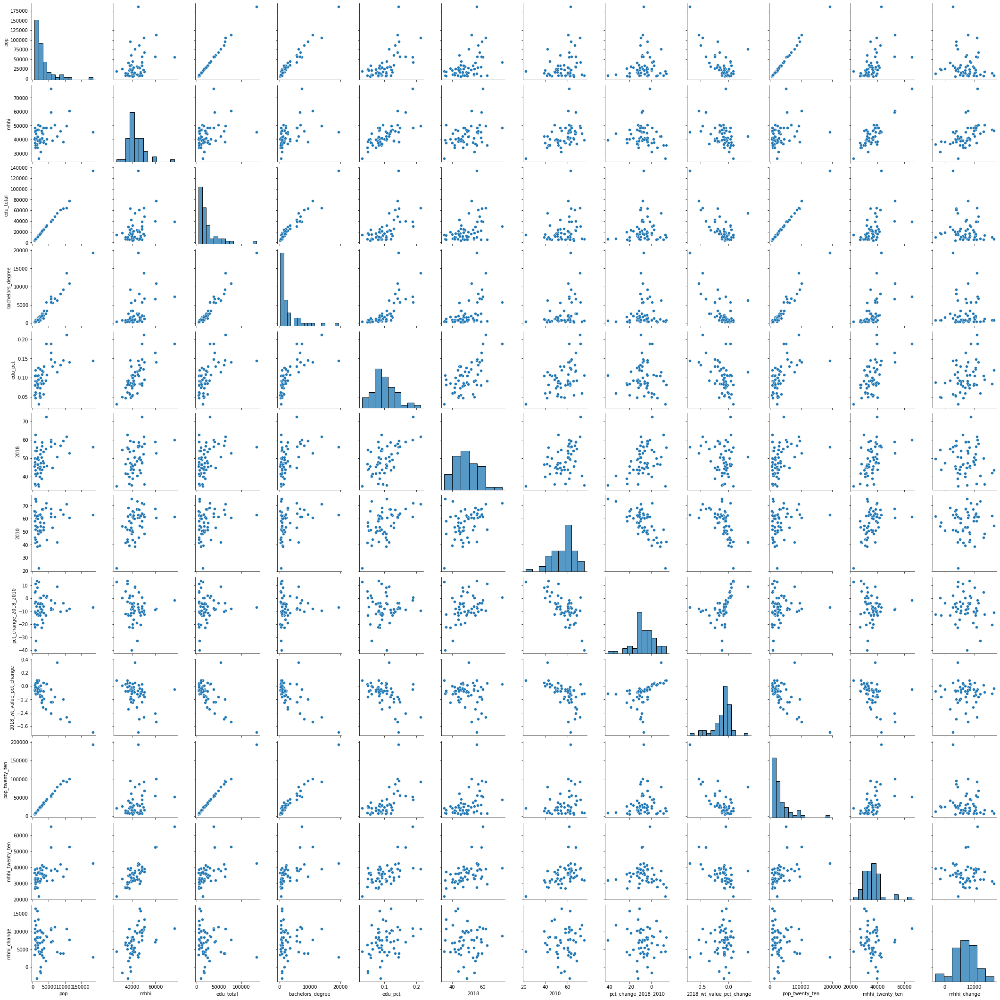

In [112]:

plt = sns.pairplot(df)

In [113]:
df.head(2)

,county,GEOID,geometry,pop,mhhi,edu_total,bachelors_degree,edu_pct,COUNTY,2018,2010,2018_num,2010_num,pct_change_2018_2010,2018_wt_value_pct_change,pop_twenty_ten,mhhi_twenty_ten,mhhi_change
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,62.4,68,93,-13.1,-0.090,16732,36956,10249
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,14014,427,0.030470,McDowell,34.7,22.0,68,51,12.7,0.087,22555,22154,4393


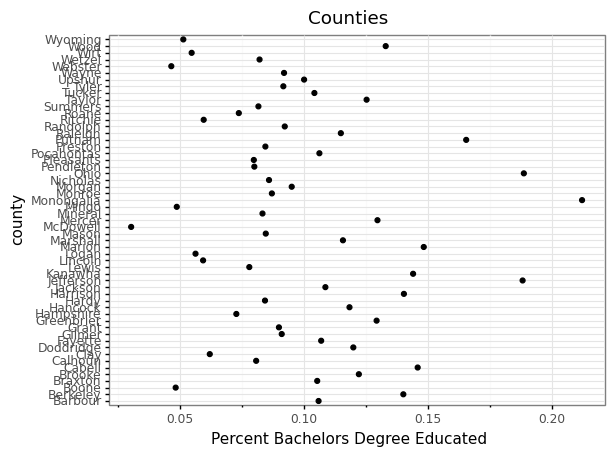

<ggplot: (8758114166537)>

In [114]:
# what percentage of students graduate across districts in the county?
display(
    ggplot(df,                    # data
        aes('edu_pct', 'COUNTY')) +          # aesthetics
        geom_point() +               # geometry
        theme_bw() + 
        labs(
            title = "Counties",
            y = "county",
            x = "Percent Bachelors Degree Educated"
        )
)   

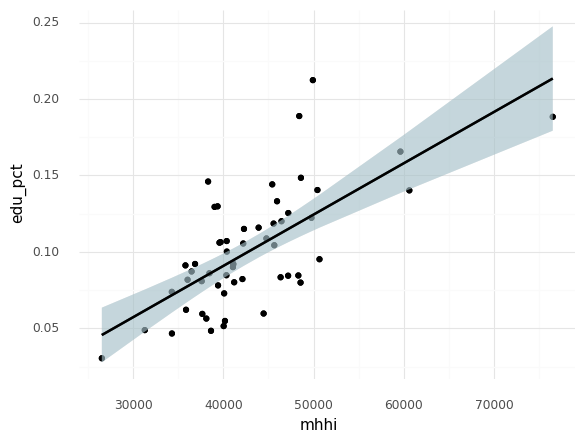

<ggplot: (8758113329293)>

In [115]:
# Is there a correlation between median household income and bachelors degree educated in counties in West Virginia?
(
    ggplot(df, aes(x='mhhi', y='edu_pct')) + geom_point()  + geom_point() + geom_smooth(method='lm') + stat_smooth(fill="#ADD8E6", alpha = .4, method="lm") + theme_minimal()
)

In [116]:
# Median Household Income --> Bachelors Degree Educated Percentage?
import statsmodels.formula.api as smf

model = smf.ols("edu_pct ~ mhhi", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                edu_pct   R-squared:                       0.466
Model:                            OLS   Adj. R-squared:                  0.456
Method:                 Least Squares   F-statistic:                     46.21
Date:                Thu, 07 Jul 2022   Prob (F-statistic):           9.54e-09
Time:                        01:09:19   Log-Likelihood:                 119.87
No. Observations:                  55   AIC:                            -235.7
Df Residuals:                      53   BIC:                            -231.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0435      0.022     -2.019      0.049      -0.087      -0.000
mhhi        3.357e-06   4.94e-07      6.798      0.000    2.37e-06    4.35e-06
==============================================================================
Omnibus:                        9.667   Durbin-Watson:                   2.441
Prob(Omnibus):                  0.008   Jarque-Bera (JB):                9.272
Skew:                           0.847   Prob(JB):                      0.00969
Kurtosis:                       4.083   Cond. No.                     2.50e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.5e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [117]:
df = df.rename(columns={'2018_wt_value_pct_change': 'wt_pct_change'})

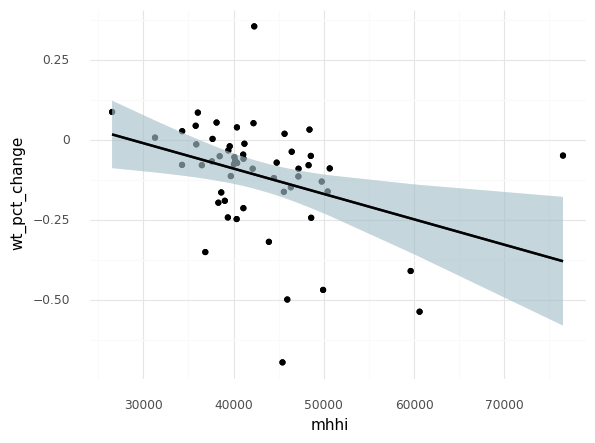

<ggplot: (8758113297853)>

In [118]:
# Is there a correlation between median household income and weighted pct change in college attending rate in West Virginia?
(
    ggplot(df, aes(x='mhhi', y='wt_pct_change')) + geom_point()  + geom_point() + geom_smooth(method='lm') + stat_smooth(fill="#ADD8E6", alpha = .4, method="lm") + theme_minimal()
)

In [119]:
# Median Household Income --> Weighted percentage in college-going rate?
import statsmodels.formula.api as smf

model = smf.ols("wt_pct_change ~ mhhi", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          wt_pct_change   R-squared:                       0.123
Model:                            OLS   Adj. R-squared:                  0.107
Method:                 Least Squares   F-statistic:                     7.437
Date:                Thu, 07 Jul 2022   Prob (F-statistic):            0.00865
Time:                        01:09:20   Log-Likelihood:                 22.440
No. Observations:                  55   AIC:                            -40.88
Df Residuals:                      53   BIC:                            -36.86
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.2272      0.127      1.795      0.078      -0.027       0.481
mhhi       -7.918e-06    2.9e-06     -2.727      0.009   -1.37e-05   -2.09e-06
==============================================================================
Omnibus:                       12.225   Durbin-Watson:                   2.259
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               18.829
Skew:                          -0.696   Prob(JB):                     8.15e-05
Kurtosis:                       5.506   Cond. No.                     2.50e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.5e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [120]:
df = df.rename(columns={'2018': 'twenty_eighteen'})

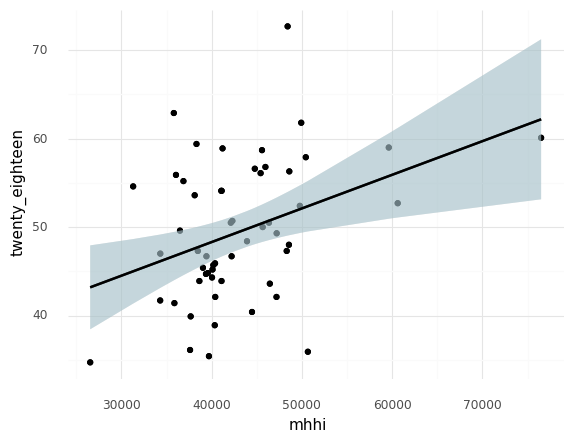

<ggplot: (8758113185781)>

In [121]:
# Is there a correlation between median household income and 2018 college attending rate for counties in West Virginia?
(
    ggplot(df, aes(x='mhhi', y='twenty_eighteen')) + geom_point()  + geom_point() + geom_smooth(method='lm') + stat_smooth(fill="#ADD8E6", alpha = .4, method="lm") + theme_minimal()
)

In [122]:
# Median Household Income --> 2018 college attending rate?
import statsmodels.formula.api as smf

model = smf.ols("twenty_eighteen ~ mhhi", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        twenty_eighteen   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.121
Method:                 Least Squares   F-statistic:                     8.432
Date:                Thu, 07 Jul 2022   Prob (F-statistic):            0.00537
Time:                        01:09:20   Log-Likelihood:                -187.08
No. Observations:                  55   AIC:                             378.2
Df Residuals:                      53   BIC:                             382.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     33.0879      5.710      5.794      0.000      21.634      44.542
mhhi           0.0004      0.000      2.904      0.005       0.000       0.001
==============================================================================
Omnibus:                        2.468   Durbin-Watson:                   1.946
Prob(Omnibus):                  0.291   Jarque-Bera (JB):                1.716
Skew:                           0.413   Prob(JB):                        0.424
Kurtosis:                       3.257   Cond. No.                     2.50e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.5e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

There does not seem to be much correlation with household income and the 2018 college attendance rate per county, which you might expect. 

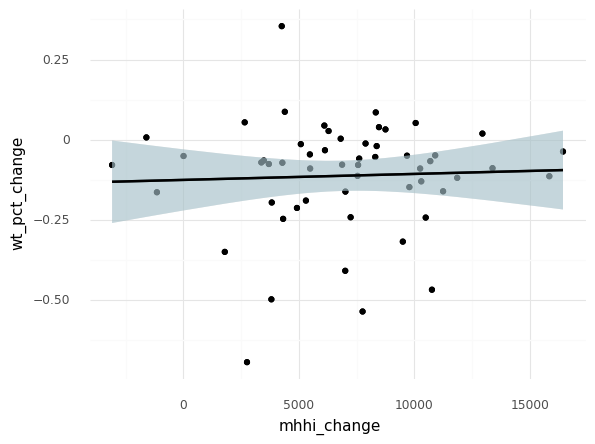

<ggplot: (8758113240797)>

In [123]:
# Is there a correlation between median household income change between 2010-2018 and weighted pct change in college attending rate in West Virginia?
(
    ggplot(df, aes(x='mhhi_change', y='wt_pct_change')) + geom_point()  + geom_point() + geom_smooth(method='lm') + stat_smooth(fill="#ADD8E6", alpha = .4, method="lm") + theme_minimal()
)

In [124]:
# weighted percent change of college going rate affected by change in income and percentage of bachelors degree in county?
import statsmodels.formula.api as smf

model = smf.ols("wt_pct_change ~ mhhi_change + edu_pct", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          wt_pct_change   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.222
Method:                 Least Squares   F-statistic:                     8.701
Date:                Thu, 07 Jul 2022   Prob (F-statistic):           0.000550
Time:                        01:09:21   Log-Likelihood:                 26.767
No. Observations:                  55   AIC:                            -47.53
Df Residuals:                      52   BIC:                            -41.51
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0667      0.062      1.072      0.289      -0.058       0.191
mhhi_change  9.244e-06    5.5e-06      1.680      0.099    -1.8e-06    2.03e-05
edu_pct        -2.4185      0.582     -4.156      0.000      -3.586      -1.251
==============================================================================
Omnibus:                        8.985   Durbin-Watson:                   2.074
Prob(Omnibus):                  0.011   Jarque-Bera (JB):               18.652
Skew:                           0.228   Prob(JB):                     8.91e-05
Kurtosis:                       5.816   Cond. No.                     2.26e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.26e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

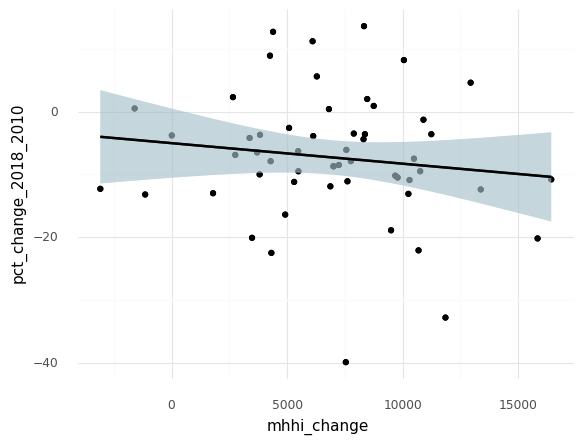

<ggplot: (8758113114521)>

In [125]:
# Is there a correlation between median household income change between 2010-2018 and weighted pct change in college attending rate in West Virginia?
(
    ggplot(df, aes(x='mhhi_change', y='pct_change_2018_2010')) + geom_point()  + geom_point() + geom_smooth(method='lm') + stat_smooth(fill="#ADD8E6", alpha = .4, method="lm") + theme_minimal()
)

In [126]:
# weighted percent change of college going rate affected by change in income and percentage of bachelors degree in county?
import statsmodels.formula.api as smf

model = smf.ols("pct_change_2018_2010 ~ mhhi_change", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     pct_change_2018_2010   R-squared:                       0.017
Model:                              OLS   Adj. R-squared:                 -0.002
Method:                   Least Squares   F-statistic:                    0.9052
Date:                  Thu, 07 Jul 2022   Prob (F-statistic):              0.346
Time:                          01:09:22   Log-Likelihood:                -204.19
No. Observations:                    55   AIC:                             412.4
Df Residuals:                        53   BIC:                             416.4
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -5.0265      2.745     -1.831      0.073     -10.532       0.479
mhhi_change    -0.0003      0.000     -0.951      0.346      -0.001       0.000
==============================================================================
Omnibus:                        5.771   Durbin-Watson:                   2.209
Prob(Omnibus):                  0.056   Jarque-Bera (JB):                5.654
Skew:                          -0.431   Prob(JB):                       0.0592
Kurtosis:                       4.313   Cond. No.                     1.61e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.61e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [127]:
# percent change of college going rate affected by change in income and percentage of bachelors degree in county?
import statsmodels.formula.api as smf

model = smf.ols("pct_change_2018_2010 ~ mhhi_change + edu_pct", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     pct_change_2018_2010   R-squared:                       0.017
Model:                              OLS   Adj. R-squared:                 -0.020
Method:                   Least Squares   F-statistic:                    0.4600
Date:                  Thu, 07 Jul 2022   Prob (F-statistic):              0.634
Time:                          01:09:22   Log-Likelihood:                -204.17
No. Observations:                    55   AIC:                             414.3
Df Residuals:                        52   BIC:                             420.4
Df Model:                             2                                         
Covariance Type:              nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -5.5712      4.143     -1.345      0.185     -13.885       2.743
mhhi_change    -0.0003      0.000     -0.949      0.347      -0.001       0.000
edu_pct         6.8520     38.762      0.177      0.860     -70.930      84.634
==============================================================================
Omnibus:                        5.509   Durbin-Watson:                   2.216
Prob(Omnibus):                  0.064   Jarque-Bera (JB):                5.420
Skew:                          -0.399   Prob(JB):                       0.0665
Kurtosis:                       4.315   Cond. No.                     2.26e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.26e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

-----

### What about opioids?



Looking at data from 2018 deaths by overdoes by county https://dhhr.wv.gov/office-of-drug-control-policy/datadashboard/Pages/default.aspx

In [128]:
drugs = pd.read_excel('2018_opioids_deaths_edited.xlsx')
drugs.sample(5)

,COUNTY,All Drugs,All Opioids,Fentanyl,Heroin,Cocaine,Methamphetamine
5,Cabell,151,137,121,51,37,60
18,Jefferson,23,23,17,1,7,0
30,Monongalia,44,33,26,5,15,13
33,Nicholas,5,1,1,0,0,5
0,Barbour,1,1,1,1,0,0


In [129]:
drugs = drugs.rename(columns={'All Opioids': 'all_opioids'})
drugs = drugs.rename(columns={'All Drugs': 'all_drugs'})

In [130]:
drugs.head(2)

,COUNTY,all_drugs,all_opioids,Fentanyl,Heroin,Cocaine,Methamphetamine
0,Barbour,1,1,1,1,0,0
1,Berkeley,73,67,52,18,24,1


In [131]:
df.head(1)

,county,GEOID,geometry,pop,mhhi,edu_total,bachelors_degree,edu_pct,COUNTY,twenty_eighteen,2010,2018_num,2010_num,pct_change_2018_2010,wt_pct_change,pop_twenty_ten,mhhi_twenty_ten,mhhi_change
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,62.4,68,93,-13.1,-0.09,16732,36956,10249


In [132]:
wv_merged3 = df.merge(drugs, on='COUNTY')
wv_merged3.head(2)

,county,GEOID,geometry,pop,mhhi,edu_total,bachelors_degree,edu_pct,COUNTY,twenty_eighteen,...,wt_pct_change,pop_twenty_ten,mhhi_twenty_ten,mhhi_change,all_drugs,all_opioids,Fentanyl,Heroin,Cocaine,Methamphetamine
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,...,-0.090,16732,36956,10249,1,1,0,1,0,1
1,047,54047,"POLYGON ((-81.99658 37.47670, -81.99292 37.482...",19217,26547,14014,427,0.030470,McDowell,34.7,...,0.087,22555,22154,4393,11,10,1,1,1,1


In [133]:
df = wv_merged3

In [134]:
df.shape

(55, 24)

In [135]:
df['deaths_pct'] = ((df['all_opioids'] / df['pop']))

In [136]:
df.head(1)

,county,GEOID,geometry,pop,mhhi,edu_total,bachelors_degree,edu_pct,COUNTY,twenty_eighteen,...,pop_twenty_ten,mhhi_twenty_ten,mhhi_change,all_drugs,all_opioids,Fentanyl,Heroin,Cocaine,Methamphetamine,deaths_pct
0,091,54091,"POLYGON ((-80.20504 39.38164, -80.19729 39.393...",16951,47205,12342,1548,0.125425,Taylor,49.3,...,16732,36956,10249,1,1,0,1,0,1,0.000059


In [137]:
drugsMap = alt.Chart(df).mark_geoshape().encode(
    color=alt.Color('deaths_pct:Q', legend=alt.Legend(title='Opioid Deaths %', format=',.2r')),
    tooltip=[alt.Tooltip('COUNTY',title='County'),
      alt.Tooltip('deaths_pct',title='Death % by County', format=',.2r')]
).properties(
    width=250,
    height=250,
    title='Opioid Deaths Percentage County 2018 (WV)'
).project(
    type='conicConformal', 
    parallels=[45 + 37 / 60, 47 + 3 / 60], 
    rotate=[94 + 15 / 60, 0]
)

drugsMap

alt.Chart(...)

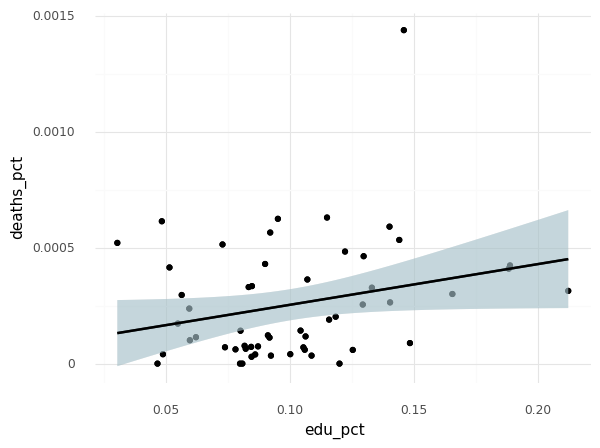

<ggplot: (8758112863301)>

In [138]:
# Is there a correlation between median household income change between 2010-2018 and weighted pct change in college attending rate in West Virginia?
(
    ggplot(df, aes(x='edu_pct', y='deaths_pct')) + geom_point()  + geom_point() + geom_smooth(method='lm') + stat_smooth(fill="#ADD8E6", alpha = .4, method="lm") + theme_minimal()
)

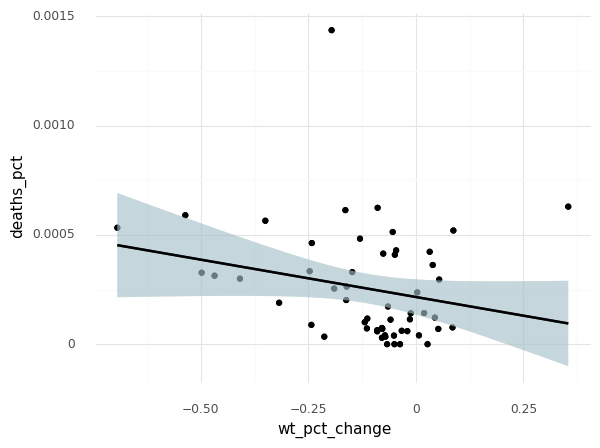

<ggplot: (8758112636893)>

In [139]:
# Is there a correlation between weighted percent change between 2010-2018 and deaths percentage by county in West Virginia?
(
    ggplot(df, aes(x='wt_pct_change', y='deaths_pct')) + geom_point()  + geom_point() + geom_smooth(method='lm') + stat_smooth(fill="#ADD8E6", alpha = .4, method="lm") + theme_minimal()
)

In [140]:
# wt_pct_change --> deaths_pct?
import statsmodels.formula.api as smf

model = smf.ols("wt_pct_change ~ deaths_pct", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          wt_pct_change   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                     3.042
Date:                Thu, 07 Jul 2022   Prob (F-statistic):             0.0870
Time:                        01:09:24   Log-Likelihood:                 20.363
No. Observations:                  55   AIC:                            -36.73
Df Residuals:                      53   BIC:                            -32.71
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0722      0.033     -2.214      0.031      -0.138      -0.007
deaths_pct  -158.7558     91.028     -1.744      0.087    -341.334      23.823
==============================================================================
Omnibus:                       10.946   Durbin-Watson:                   2.397
Prob(Omnibus):                  0.004   Jarque-Bera (JB):               16.852
Skew:                          -0.604   Prob(JB):                     0.000219
Kurtosis:                       5.428   Cond. No.                     3.97e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.97e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [141]:
# pct_change --> deaths_pct?
import statsmodels.formula.api as smf

model = smf.ols("pct_change_2018_2010 ~ deaths_pct", data=df)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     pct_change_2018_2010   R-squared:                       0.013
Model:                              OLS   Adj. R-squared:                 -0.005
Method:                   Least Squares   F-statistic:                    0.7235
Date:                  Thu, 07 Jul 2022   Prob (F-statistic):              0.399
Time:                          01:09:24   Log-Likelihood:                -204.28
No. Observations:                    55   AIC:                             412.6
Df Residuals:                        53   BIC:                             416.6
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -8.4653      1.937     -4.369      0.000     -12.351      -4.579
deaths_pct  4599.8268   5407.923      0.851      0.399   -6247.094    1.54e+04
==============================================================================
Omnibus:                        5.416   Durbin-Watson:                   2.132
Prob(Omnibus):                  0.067   Jarque-Bera (JB):                5.199
Skew:                          -0.406   Prob(JB):                       0.0743
Kurtosis:                       4.269   Cond. No.                     3.97e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.97e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### ALL the Maps

In [142]:
mhhiMap = alt.Chart(df).mark_geoshape().encode(
    color=alt.Color('deaths_pct:Q', legend=alt.Legend(title='Opioid Deaths %', format=',.2r')),
    tooltip=[alt.Tooltip('COUNTY',title='County'),
      alt.Tooltip('deaths_pct',title='Death % by County', format=',.2r')]
).properties(
    width=250,
    height=250,
    title='Opioid Deaths Percentage County 2018 (WV)'
).project(
    type='conicConformal', 
    parallels=[45 + 37 / 60, 47 + 3 / 60], 
    rotate=[94 + 15 / 60, 0]
)

drugsMap

alt.Chart(...)

In [143]:
alt.vconcat(alt.hconcat(wvGTCCalcsMap)).configure_view(strokeWidth=0)

alt.VConcatChart(...)

In [144]:
alt.vconcat(alt.hconcat(wvEduMap2)).configure_view(strokeWidth=0)

alt.VConcatChart(...)

In [145]:
alt.vconcat(alt.hconcat(wvIncomeMap)).configure_view(strokeWidth=0)

alt.VConcatChart(...)

In [146]:
alt.vconcat(alt.hconcat( drugsMap)).configure_view(strokeWidth=0)

alt.VConcatChart(...)

In [147]:
# df['mhhi_change_pop'] = ((df['mhhi_change'] / df['pop'])